## Testing SD Models to achieve a balance between Speed & Quality

### Stable Diffusion v1.5

**Note:** The official SD v1.5 Model has been depricated however mirrors of the original repository have been made as per this [Link](https://huggingface.co/Jiali/stable-diffusion-1.5).

Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00,  6.63it/s]


Time Taken: 5.1769890785217285


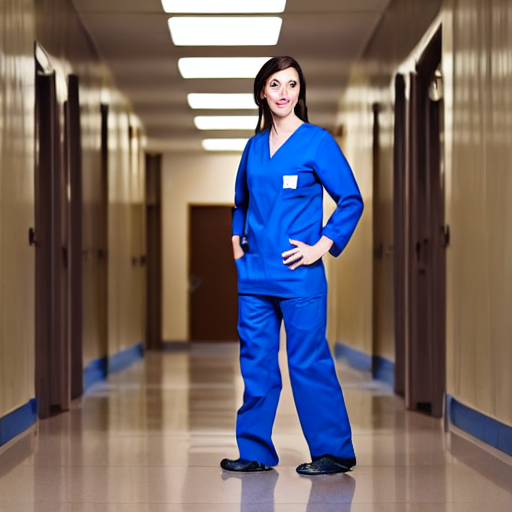

In [13]:
from diffusers import StableDiffusionPipeline
import torch
import time

model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16, safety_checker=None, requires_safety_checker=False)

# pipe.enable_attention_slicing() # Activate this to reduce VRAM usage
pipe.set_progress_bar_config(disable=True)

pipe = pipe.to("cuda")

prompt = "realistic portrait photo of a female doctor wearing blue scrubs in a hospital corridor, professional lighting"
start_time = time.time()
image = pipe(
    prompt=[prompt], # * 4, By passing in multiple prompts we can generate images in batches
    num_inference_steps=50, # Default Values
    guidance_scale=7.5 # Default Values  
).images[0] 

print(f"Time Taken: {time.time() - start_time}")

display(image)

### Stable Diffusion v1.5 + LoRA

**Note:** The original SD v1.5 checkpoint is deprecated, but mirrored versions remain available (e.g., [https://huggingface.co/Jiali/stable-diffusion-1.5](https://huggingface.co/Jiali/stable-diffusion-1.5)). The LCM-LoRA used here is from: [https://huggingface.co/latent-consistency/lcm-lora-sdv1-5](https://huggingface.co/latent-consistency/lcm-lora-sdv1-5).

**LoRA overview:**
A **LoRA (Low-Rank Adaptation)** is a lightweight method for fine-tuning large diffusion models. Instead of modifying the full model, LoRA adds small low-rank matrices to targeted layers (usually attention) while keeping the base weights frozen. These matrices approximate the weight update (ΔW ≈ A×B), allowing the model to learn new behaviors with minimal memory and without altering the original checkpoint. LoRAs are plug-and-play, can be combined, and can be applied at inference time.

**LCM-LoRA specifically** modifies the denoising behavior of SD v1.5 so that high-quality images can be generated in only a few inference steps, improving speed while keeping the underlying model unchanged.


Loading pipeline components...: 100%|██████████| 6/6 [00:01<00:00,  5.61it/s]
No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


Time Taken: 0.42272043228149414


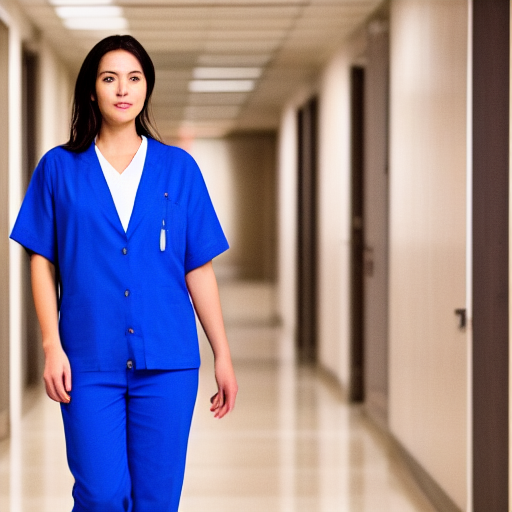

In [2]:
import torch
from diffusers import DiffusionPipeline, LCMScheduler   
import time

# 1. Load the base model (SD v1.5)
model_id = "runwayml/stable-diffusion-v1-5"
pipe = DiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16, safety_checker=None, requires_safety_checker=False)

# pipe.enable_attention_slicing() # Activate this to reduce VRAM usage
pipe.set_progress_bar_config(disable=True)

# 2. Load the LCM-LoRA adapter
pipe.load_lora_weights("latent-consistency/lcm-lora-sdv1-5")
pipe.fuse_lora() # Fuses weights for faster inference

# 3. Switch to LCM Scheduler (Crucial for speed)
pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config) # The LCMScheduler is required in conjucntion with the LORA as it facilitates the reduction in the num_inference_steps to 4. 
pipe.to("cuda")

# 4. Generation Loop
prompt = "realistic portrait photo of a female doctor wearing blue scrubs in a hospital corridor, professional lighting"

start_time = time.time()
image = pipe(
    prompt=[prompt],
    num_inference_steps=4,  # LCM needs only 4 steps, < 4 distorts the images whilst > 4 doesn't produce any noticable benefit
    guidance_scale=1      # LCM works best with guidance between 0 and 2
).images[0]
print(f"Time Taken: {time.time() - start_time}")

display(image)

### Stable Diffusion v2.1

**Note:** The official SD v2.1 Model has been depricated however mirrors of the original repository have been made as per this [Link](https://huggingface.co/CompVis/stable-diffusion-v1-2). Additionally SD v2.1 appears to not have been a very popular model hence no lora's appear to be available on Hugging Face for it.

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]An error occurred while trying to fetch D:\HuggingFace_Models\hub\models--CompVis--stable-diffusion-v1-2\snapshots\f519eebf1372598b85ab317ec273a63ebeddd5eb\unet: Error no file named diffusion_pytorch_model.safetensors found in directory D:\HuggingFace_Models\hub\models--CompVis--stable-diffusion-v1-2\snapshots\f519eebf1372598b85ab317ec273a63ebeddd5eb\unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
Loading pipeline components...:  33%|███▎      | 2/6 [00:00<00:01,  2.95it/s]An error occurred while trying to fetch D:\HuggingFace_Models\hub\models--CompVis--stable-diffusion-v1-2\snapshots\f519eebf1372598b85ab317ec273a63ebeddd5eb\vae: Error no file named diffusion_pytorch_model.safetensors found in directory D:\HuggingFace_Models\hub\models--CompVis--stable-diffusion-v1-2\snapshots\f519eebf1372598b85ab317ec273a63ebeddd5eb\vae.
Defaulting to unsafe serialization. Pass `allow_p

Time Taken: 5.159373998641968


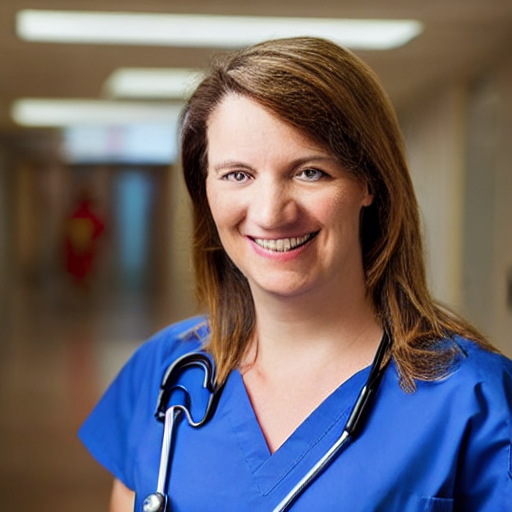

In [ ]:
from diffusers import StableDiffusionPipeline
import torch
import time

model_id = "CompVis/stable-diffusion-v1-2"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16, safety_checker=None, requires_safety_checker=False)

# pipe.enable_attention_slicing() # Activate this to reduce VRAM usage
pipe.set_progress_bar_config(disable=True)

pipe = pipe.to("cuda")

prompt = "realistic portrait photo of a female doctor wearing blue scrubs in a hospital corridor, professional lighting"
start_time = time.time()
image = pipe(
    prompt=[prompt], # * 4, By passing in multiple prompts we can generate images in batches
    num_inference_steps=50, # Default Values
    guidance_scale=7.5 # Default Values  
).images[0] 

print(f"Time Taken: {time.time() - start_time}")

display(image)

### SDXL

SDXL Overview: SDXL (Stable Diffusion XL) is a significant evolution from the v1.5 architecture, designed natively for higher resolution (1024x1024) generation. It utilizes a roughly 3x larger U-Net and combines two distinct text encoders (OpenCLIP ViT-bigG/14 and CLIP ViT-L/14) to better understand complex prompts. SDXL introduces a unique two-stage architecture: a "Base" model generates the noisy latents, and a specialized "Refiner" model (optional but recommended) polishes the fine details in the final denoising steps to improve texture and local coherence.

**Note:** The official SDXL Base 1.0 checkpoint is available at: https://huggingface.co/stabilityai/stable-diffusion-xl-base-1.0. The optional Refiner is available at: https://huggingface.co/stabilityai/stable-diffusion-xl-refiner-1.0.

100%|██████████| 50/50 [00:33<00:00,  1.47it/s]
c:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\StableDiffusionImageGeneration\.venv\lib\site-packages\diffusers\pipelines\stable_diffusion_xl\pipeline_stable_diffusion_xl.py:748: FutureWarning: `upcast_vae` is deprecated and will be removed in version 1.0.0. `upcast_vae` is deprecated. Please use `pipe.vae.to(torch.float32)`. For more details, please refer to: https://github.com/huggingface/diffusers/pull/12619#issue-3606633695.
  deprecate(


Time Taken: 41.23800086975098


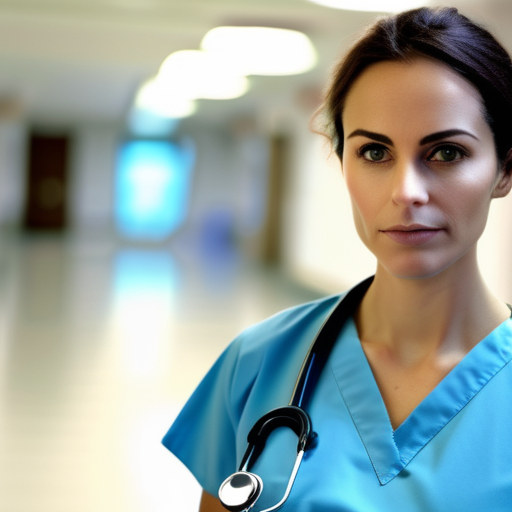

In [18]:
import torch
from diffusers import DiffusionPipeline, LCMScheduler   
import time

# 1. Load SDXL Base Model
model_id = "stabilityai/stable-diffusion-xl-base-1.0"
pipe = DiffusionPipeline.from_pretrained(
    model_id, 
    torch_dtype=torch.float16, 
    variant="fp16", # SDXL usually requires this variant flag
    use_safetensors=True
)

# pipe.set_progress_bar_config(disable=True)
pipe.to("cuda")

# 4. Generation Loop
prompt = "realistic portrait photo of a female doctor wearing blue scrubs in a hospital corridor, professional lighting, 8k"

start_time = time.time()
image = pipe(
    prompt=[prompt],
    width=512,
    height=512,
    num_inference_steps=50, # Default Value
    guidance_scale=7.5 # Default Value
).images[0]

print(f"Time Taken: {time.time() - start_time}")
display(image)

### SDXL + LoRa

Applying LoRA to SDXL follows the same low-rank adaptation principle as v1.5 but targets a much larger parameter space (the SDXL Transformer blocks). Because SDXL has far more attention layers, SDXL LoRAs are typically larger in file size than their v1.5 counterparts (often 50MB–200MB vs. the <100MB of v1.5). They are critical for SDXL workflows because fine-tuning the full 3.5B parameter base model is computationally prohibitive for most users. SDXL LoRAs are particularly effective at correcting the base model's anatomy issues or enforcing specific artistic styles at 1024px resolutions.

**Note:** SDXL LoRAs are widely available on platforms like Civitai and Hugging Face. Due to the architecture differences, LoRAs trained for SD v1.5 are not compatible with SDXL. The LoRa used here is tuned for speed as opposed to alterting the model output. The official SDXL Base 1.0 checkpoint is available at: https://huggingface.co/stabilityai/stable-diffusion-xl-base-1.0. The optional Refiner is available at: https://huggingface.co/stabilityai/stable-diffusion-xl-refiner-1.0. The LoRa is available here: https://huggingface.co/latent-consistency/lcm-lora-sdxl \& https://huggingface.co/ByteDance/SDXL-Lightning

Loading pipeline components...: 100%|██████████| 7/7 [00:01<00:00,  5.69it/s]
No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new
No LoRA keys associated to CLIPTextModelWithProjection found with the prefix='text_encoder_2'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModelWithProjection related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new
The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.
100%|██████

Time Taken: 7.049205780029297


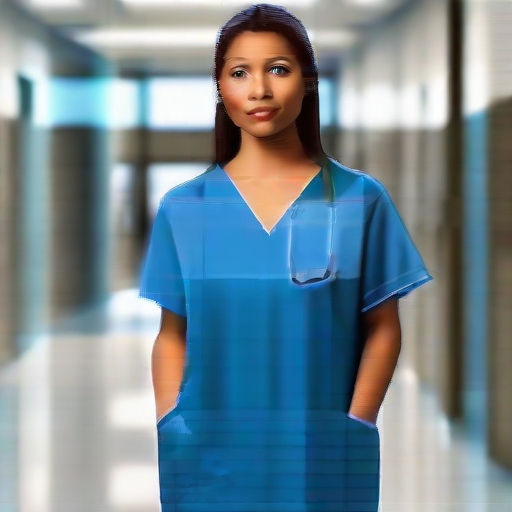

In [ ]:
import torch
from diffusers import DiffusionPipeline, LCMScheduler   
import time

# 1. Load SDXL Base Model
model_id = "stabilityai/stable-diffusion-xl-base-1.0"
pipe = DiffusionPipeline.from_pretrained(
    model_id, 
    torch_dtype=torch.float16, 
    variant="fp16",
    use_safetensors=True
)

# pipe.set_progress_bar_config(disable=True)

# 2. Load the SDXL specific LCM-LoRA
pipe.load_lora_weights("latent-consistency/lcm-lora-sdxl")
pipe.fuse_lora()

# 3. Switch to LCM Scheduler
pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)
pipe.to("cuda")

# 4. Generation Loop
prompt = "realistic portrait photo of a female doctor wearing blue scrubs in a hospital corridor, professional lighting, 8k"

start_time = time.time()
image = pipe(
    prompt=[prompt],
    width=512,
    height=512,
    num_inference_steps=4,
    guidance_scale=1.0
).images[0]

print(f"Time Taken: {time.time() - start_time}")
display(image)

Loading pipeline components...: 100%|██████████| 7/7 [00:01<00:00,  5.44it/s]
No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new
No LoRA keys associated to CLIPTextModelWithProjection found with the prefix='text_encoder_2'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModelWithProjection related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new
100%|██████████| 2/2 [00:11<00:00,  5.95s/it]


Time Taken: 53.540000438690186


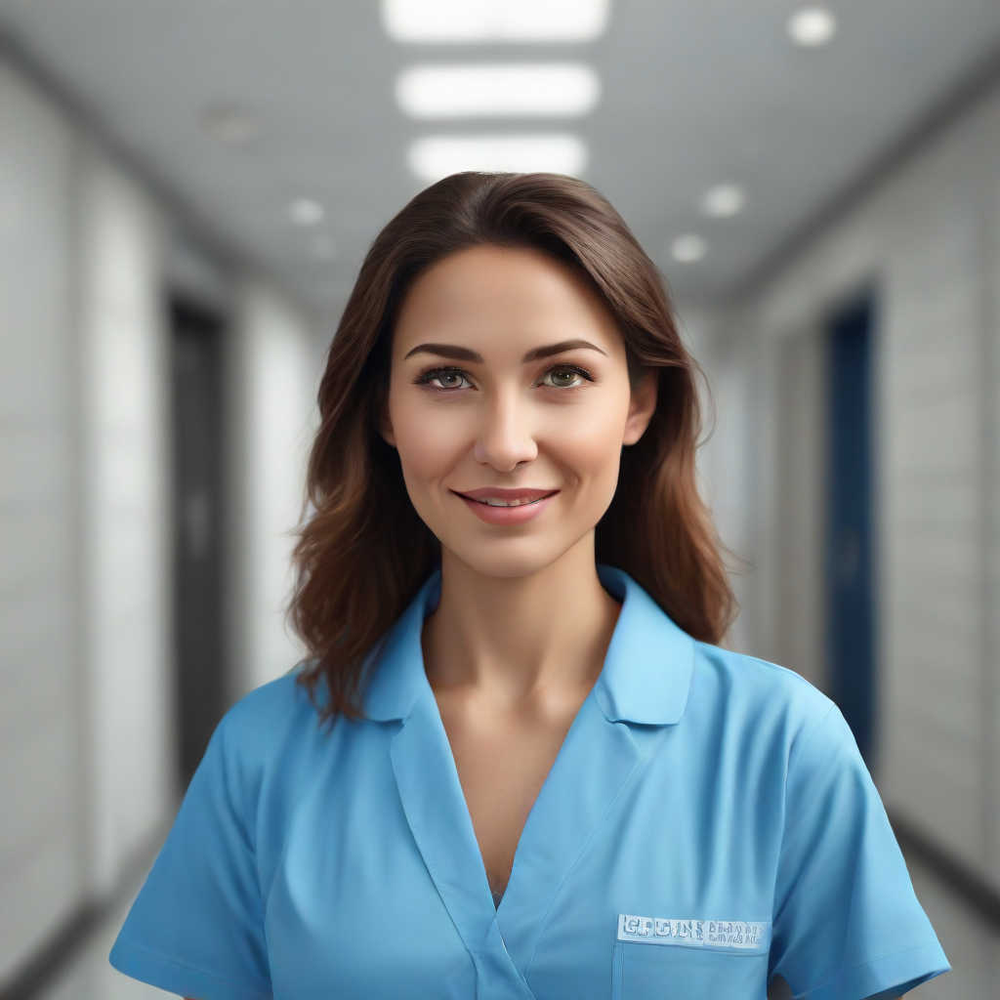

In [5]:
import torch
from diffusers import StableDiffusionXLPipeline, EulerDiscreteScheduler
import time

# 1. Load the Base Pipeline normally
base = "stabilityai/stable-diffusion-xl-base-1.0"
pipe = StableDiffusionXLPipeline.from_pretrained(
    base, 
    torch_dtype=torch.float16, 
    variant="fp16"
).to("cuda")

# 2. Load the Lightning LoRA
# Note: We use the `_lora.safetensors` file, not the `_unet` file
repo = "ByteDance/SDXL-Lightning"
# ckpt_lora = "sdxl_lightning_4step_lora.safetensors" 
ckpt_lora = "sdxl_lightning_2step_lora.safetensors" 

pipe.load_lora_weights(repo, weight_name=ckpt_lora)
pipe.fuse_lora() # Optional: Merge for speed

# 3. Set Scheduler (Still required!)
pipe.scheduler = EulerDiscreteScheduler.from_config(
    pipe.scheduler.config, 
    timestep_spacing="trailing"
)

# 4. Generate
prompt = "realistic portrait photo of a female doctor wearing blue scrubs in a hospital corridor, professional lighting"

start_time = time.time()
image = pipe(
    prompt=prompt,
    # width=512,
    # height=512,
    num_inference_steps=2,
    guidance_scale=0.0
).images[0]
print(f"Time Taken: {time.time() - start_time}")
display(image)

### SDXL-Turbo

SDXL-Turbo is a high-speed, distilled version of SDXL 1.0 designed for real-time synthesis. Unlike standard models that require 20–50 steps, SDXL-Turbo uses a novel training method called Adversarial Diffusion Distillation (ADD). This technique combines score distillation (from standard diffusion) with adversarial loss (from GANs), allowing the model to generate high-quality image outputs in a single step.

While it is based on the SDXL architecture, it is trained specifically for 512x512 resolution. Generating at higher resolutions (like 1024x1024) without upscaling often results in artifacts. It generally ignores the "Guidance Scale" (CFG) parameter, which should be kept at 0.0 or 1.0.

**Note:** The official SDXL-Turbo checkpoint is available at: https://huggingface.co/stabilityai/sdxl-turbo

Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00, 13.46it/s]


Generating...


100%|██████████| 4/4 [00:07<00:00,  1.84s/it]
c:\MastersRepos\ARI5902-Research-Topics-in-AI\LAION-5B Testing\StableDiffusionImageGeneration\.venv\lib\site-packages\diffusers\pipelines\stable_diffusion_xl\pipeline_stable_diffusion_xl.py:748: FutureWarning: `upcast_vae` is deprecated and will be removed in version 1.0.0. `upcast_vae` is deprecated. Please use `pipe.vae.to(torch.float32)`. For more details, please refer to: https://github.com/huggingface/diffusers/pull/12619#issue-3606633695.
  deprecate(


Time Taken (SDXL-Turbo): 16.1551 seconds


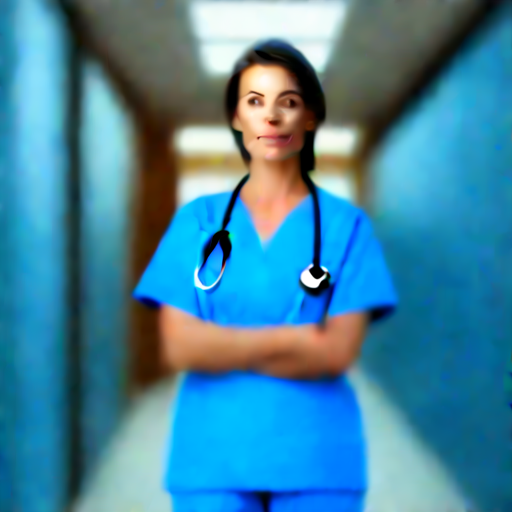

In [13]:
import torch
from diffusers import AutoPipelineForText2Image
import time

# 1. Load SDXL Turbo
pipe = AutoPipelineForText2Image.from_pretrained(
    "stabilityai/sdxl-turbo", 
    torch_dtype=torch.float16, 
    variant="fp16"
)
pipe.to("cuda")

# 2. Generate
prompt = "realistic portrait photo of a female doctor wearing blue scrubs in a hospital corridor, professional lighting"

print("Generating...")
start_time = time.time()

image = pipe(
    prompt=prompt,
    width=512,
    height=512,
    num_inference_steps=4,
    # guidance_scale=1.0      # Keep guidance at 1.0 for this model
).images[0]

print(f"Time Taken (SDXL-Turbo): {time.time() - start_time:.4f} seconds")
display(image)

### SSD-1B

SSD-1B is a distilled version of SDXL, designed to be smaller and faster while retaining high-resolution capabilities. Through a process called block removal distillation, roughly 40% of the SDXL U-Net layers (specifically the mid-blocks and transformer blocks) were removed, reducing the model size by ~50% and increasing inference speed by ~60%. Unlike quantization (which lowers precision), this architectural pruning allows SSD-1B to run on consumer GPUs with lower VRAM requirements while generating images visually comparable to the full SDXL Base.

**Note:** The official SSD-1B checkpoint is available here: https://huggingface.co/segmind/SSD-1B.

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`
Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`
Fetching 18 files:  11%|█         | 2/18 [00:00<00:04,  3.67it/s]Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`
Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install

Time Taken (SSD-1B): 14.255290508270264


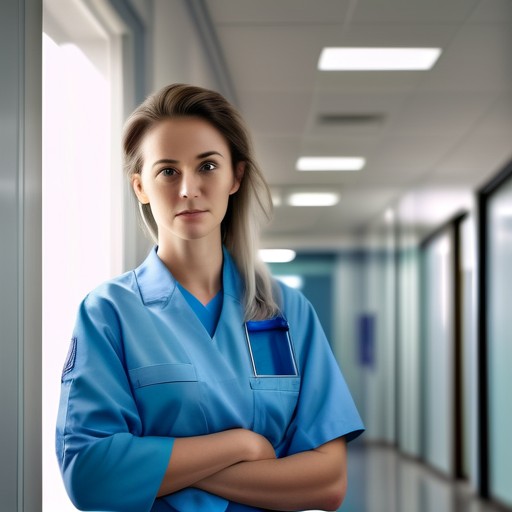

In [19]:
import torch
from diffusers import DiffusionPipeline, LCMScheduler   
import time

# 1. Load SSD-1B Base Model
model_id = "segmind/SSD-1B"
pipe = DiffusionPipeline.from_pretrained(
    model_id, 
    torch_dtype=torch.float16, 
    use_safetensors=True
)

# pipe.set_progress_bar_config(disable=True)
pipe.to("cuda")

# 2. Generation Loop
prompt = "realistic portrait photo of a female doctor wearing blue scrubs in a hospital corridor, professional lighting"

start_time = time.time()
image = pipe(
    prompt=[prompt],
    height=512,
    width=512,
    # num_inference_steps=4,
    # guidance_scale=1.0 
).images[0]

print(f"Time Taken (SSD-1B): {time.time() - start_time}")
display(image)

### SSD-1B + LoRa

One of the key advantages of SSD-1B is its ability to use most SDXL LoRAs directly, despite the missing layers. Because SSD-1B retains the same text encoders and the core structural weights of SDXL, the adapter weights from an SDXL LoRA can usually map correctly to the remaining layers of SSD-1B. However, because some layers the LoRA expects might be missing (due to the distillation/pruning), the effect of an SDXL LoRA might be slightly weaker or different on SSD-1B than on the full Base model. Dedicated LoRAs can also be trained specifically on the SSD-1B architecture for maximum efficiency.

**Note:** Since SSD-1B is derived from SDXL, it maintains high compatibility with the SDXL ecosystem. The official SSD-1B checkpoint is available here: https://huggingface.co/segmind/SSD-1B \& the LoRa here: https://huggingface.co/latent-consistency/lcm-lora-ssd-1b

Loading pipeline components...: 100%|██████████| 7/7 [00:02<00:00,  3.43it/s]
Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`
No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new
No LoRA keys associated to CLIPTextModelWithProjection found with the prefix='text_encoder_2'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModelWithProjection related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://gi

Time Taken (SSD-1B): 1.8632302284240723


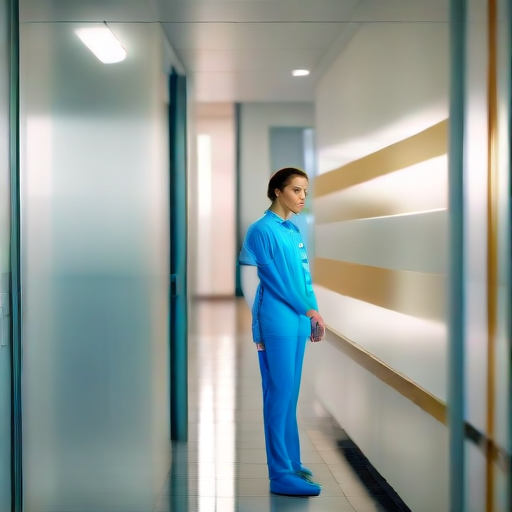

In [20]:
import torch
from diffusers import DiffusionPipeline, LCMScheduler   
import time

# 1. Load SSD-1B Base Model
model_id = "segmind/SSD-1B"
pipe = DiffusionPipeline.from_pretrained(
    model_id, 
    torch_dtype=torch.float16, 
    use_safetensors=True
)

# pipe.set_progress_bar_config(disable=True)

# 2. Load the SSD-1B specific LCM-LoRA
pipe.load_lora_weights("latent-consistency/lcm-lora-ssd-1b")
pipe.fuse_lora()

# 3. Switch to LCM Scheduler
pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)
pipe.to("cuda")

# 4. Generation Loop
prompt = "realistic portrait photo of a female doctor wearing blue scrubs in a hospital corridor, professional lighting"

start_time = time.time()
image = pipe(
    prompt=[prompt],
    height=512,
    width=512,
    num_inference_steps=4,
    guidance_scale=1.0 
).images[0]

print(f"Time Taken (SSD-1B): {time.time() - start_time}")
display(image)

### PixArt-Alpha

PixArt-Alpha (PixArt-XL-2-1024-MS) is a high-quality, open-source text-to-image model that departs from the traditional U-Net architecture used in Stable Diffusion. Instead, it uses a Diffusion Transformer (DiT) backbone, which allows it to process images more like a Large Language Model processes text. It utilizes the powerful T5 text encoder (specifically T5-v1.1-xxl) for superior prompt understanding.

The "MS" in the name stands for Multi-Scale, meaning the model was specifically trained to handle multiple aspect ratios (e.g., portrait, landscape, square) naturally at 1024px resolution without cropping or stretching artifacts. It is known for its extreme training efficiency (requiring <10% of the training cost of SD v1.5) while rivaling SDXL in image quality.

**Note:** The official PixArt-XL-2-1024-MS checkpoint is available at: https://huggingface.co/PixArt-alpha/PixArt-XL-2-1024-MS.

Loading pipeline components...:  60%|██████    | 3/5 [00:01<00:00,  3.12it/s]Some weights of the model checkpoint at D:\HuggingFace_Models\hub\models--PixArt-alpha--PixArt-XL-2-1024-MS\snapshots\b89adadeccd9ead2adcb9fa2825d3fabec48d404\transformer were not used when initializing PixArtTransformer2DModel: 
 ['caption_projection.y_embedding']
Loading pipeline components...: 100%|██████████| 5/5 [00:25<00:00,  5.17s/it]

Setting `clean_caption=True` requires the Beautiful Soup library but it was not found in your environment. You can install it with pip:
`pip install beautifulsoup4`. Please note that you may need to restart your runtime after installation.

Setting `clean_caption` to False...

Setting `clean_caption=True` requires the Beautiful Soup library but it was not found in your environment. You can install it with pip:
`pip install beautifulsoup4`. Please note that you may need to restart your runtime after installation.

Setting `clean_caption` to False...
100%|██████████| 20/20 

Time Taken (PixArt): 637.9479866027832


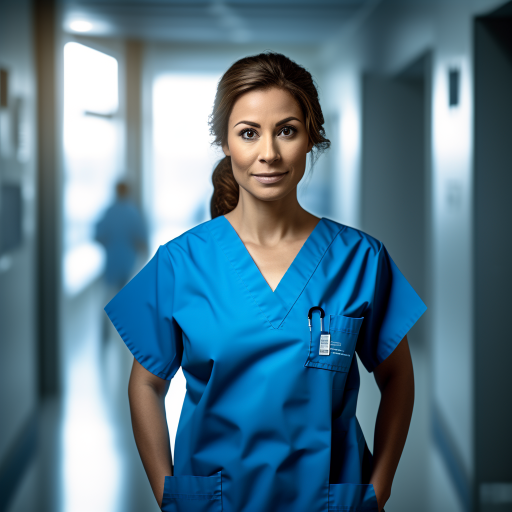

In [3]:
import torch
from diffusers import PixArtAlphaPipeline
import time

# 1. Load PixArt-Alpha
# Note: This model uses a Transformer backbone, not a U-Net
pipe = PixArtAlphaPipeline.from_pretrained(
    "PixArt-alpha/PixArt-XL-2-1024-MS", 
    torch_dtype=torch.float16,
    use_safetensors=True,
    clean_caption=False
)

pipe.to("cuda")
# pipe.set_progress_bar_config(disable=True)

# 2. Generate
prompt = "realistic portrait photo of a female doctor wearing blue scrubs in a hospital corridor, professional lighting"

start_time = time.time()
image = pipe(
    prompt=[prompt],
    height=512,
    width=512,
    num_inference_steps=14 # Can go as low as ~14 without breaking 20 is default
).images[0]

print(f"Time Taken (PixArt): {time.time() - start_time}")
display(image)

### PixArt-Alpha LCM

Model Overview: PixArt-LCM-XL-2-1024-MS is the "turbo" version of the model above. It takes the powerful PixArt-Alpha architecture and applies Latent Consistency Model (LCM) distillation to it. This effectively compresses the inference process, allowing the model to "jump" to the final image solution rather than iterating slowly.

While the standard model requires ~20-50 steps to generate a clear image, this LCM version is capable of generating high-fidelity 1024px images in just 4 to 8 steps. It retains the T5 text encoder and Multi-Scale capabilities of the parent model but is optimized purely for speed and low latency.

**Note:** The LCM version is available at: https://huggingface.co/PixArt-alpha/PixArt-LCM-XL-2-1024-MS.

Keyword arguments {'clean_caption': False} are not expected by PixArtAlphaPipeline and will be ignored.
Loading pipeline components...:  60%|██████    | 3/5 [00:01<00:00,  3.14it/s]Some weights of the model checkpoint at D:\HuggingFace_Models\hub\models--PixArt-alpha--PixArt-LCM-XL-2-1024-MS\snapshots\e153060b10990994d2ed31304b3224da47fbd740\transformer were not used when initializing PixArtTransformer2DModel: 
 ['caption_projection.y_embedding']
Loading pipeline components...: 100%|██████████| 5/5 [00:25<00:00,  5.16s/it]

Setting `clean_caption=True` requires the Beautiful Soup library but it was not found in your environment. You can install it with pip:
`pip install beautifulsoup4`. Please note that you may need to restart your runtime after installation.

Setting `clean_caption` to False...


Generating...


100%|██████████| 4/4 [00:52<00:00, 13.15s/it]


Time Taken (PixArt LCM): 79.8021 seconds


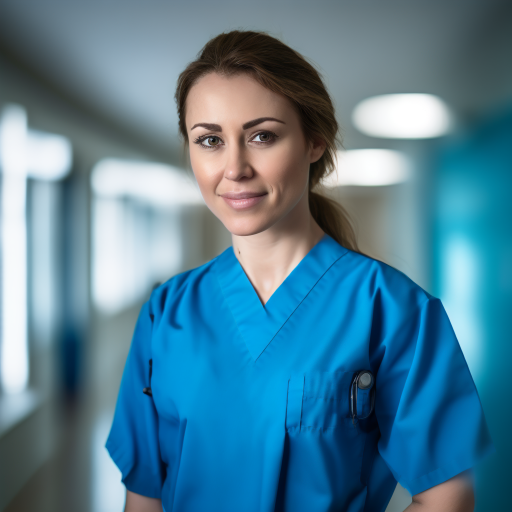

In [5]:
import torch
from diffusers import PixArtAlphaPipeline, LCMScheduler
import time

# 1. Load the LCM version of PixArt directly
# We use "PixArt-alpha/PixArt-LCM-XL-2-1024-MS" instead of the base model
model_id = "PixArt-alpha/PixArt-LCM-XL-2-1024-MS"

pipe = PixArtAlphaPipeline.from_pretrained(
    model_id, 
    torch_dtype=torch.float16,
    use_safetensors=True,
    clean_caption=False
)

# 2. Switch Scheduler (Still required for LCM)
pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)
pipe.to("cuda")
# pipe.set_progress_bar_config(disable=True)

# 3. Generate
prompt = "realistic portrait photo of a female doctor wearing blue scrubs in a hospital corridor, professional lighting"

print("Generating...")
start_time = time.time()

image = pipe(
    prompt=prompt,
    width=512,
    height=512,
    num_inference_steps=4,  # LCM works perfectly at 4 steps
    guidance_scale=1.0      # Keep guidance at 1.0 for this model
).images[0]

print(f"Time Taken (PixArt LCM): {time.time() - start_time:.4f} seconds")
display(image)

### Segmind Vega

Segmind Vega is a "compact" or distilled version of SDXL. Through a process called Block Removal Distillation, the researchers identified and removed the least important layers of the massive SDXL U-Net.

Size: It is 70% smaller than the standard SDXL Base model.

Speed: It runs 100% faster (double the speed) per step compared to SDXL Base.

Behavior: Despite being smaller, it behaves like a traditional diffusion model. It still requires 20–50 steps to generate an image and uses standard schedulers (Euler, DPMSolver). It retains the dual text-encoders of SDXL, ensuring it still understands complex prompts effectively.

**Note:** The official Segmind Vega checkpoint is available at: https://huggingface.co/segmind/Segmind-Vega

100%|██████████| 50/50 [00:03<00:00, 14.76it/s]


Time Taken (VegaRT): 3.7663609981536865


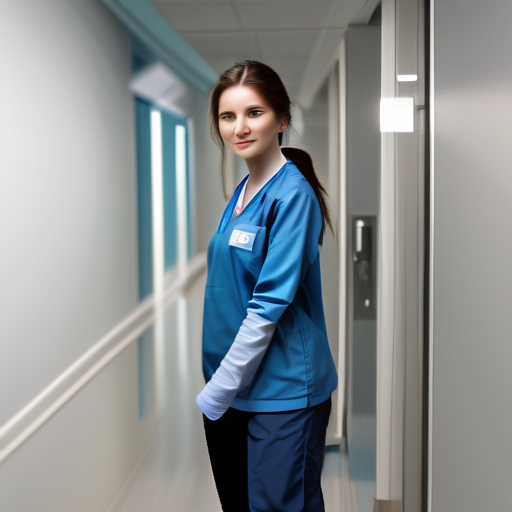

In [9]:
import torch
from diffusers import DiffusionPipeline, LCMScheduler
import time

# 1. Load Segmind VegaRT
# This is a specialized "Tiny" SDXL model
model_id = "segmind/Segmind-Vega"
pipe = DiffusionPipeline.from_pretrained(
    model_id, 
    torch_dtype=torch.float16, 
    use_safetensors=True,
    variant="fp16"
)

# pipe.set_progress_bar_config(disable=True)
pipe.to("cuda")

prompt = "realistic portrait photo of a female doctor wearing blue scrubs in a hospital corridor, professional lighting"

start_time = time.time()
# VegaRT is optimized for 2 to 4 steps
image = pipe(
    prompt=prompt,
    width=512,
    height=512,
    # num_inference_steps=4, 
    # guidance_scale=0.0 # Turbo-distilled models often prefer 0 guidance
).images[0]

print(f"Time Taken (VegaRT): {time.time() - start_time}")
display(image)

### Segmind Vega + Vega RT (LoRa)

This setup represents the "Holy Grail" of speed optimization: Architectural Compression + Latent Consistency.

The Base (Vega): You start with the physically smaller Vega model, which calculates each step very fast.

The Accelerator (VegaRT): You add the VegaRT LoRA, which uses Latent Consistency (LCM) technology to reduce the number of steps needed from 30 down to 2–8.

The Result: A pipeline that runs on lighter hardware (due to Vega's small size) and finishes in a fraction of a second (due to the RT LoRA's low step count). This is currently one of the fastest ways to generate high-quality images on consumer GPUs.

**Note:** This combination uses the Vega Base model (https://huggingface.co/segmind/Segmind-Vega plus the VegaRT LCM-LoRA ([Link](https://huggingface.co/segmind/Segmind-VegaRT)).

Loading pipeline components...: 100%|██████████| 7/7 [00:01<00:00,  5.69it/s]
No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new
No LoRA keys associated to CLIPTextModelWithProjection found with the prefix='text_encoder_2'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModelWithProjection related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new
The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.
100%|██████

Time Taken (VegaRT): 5.9202492237091064


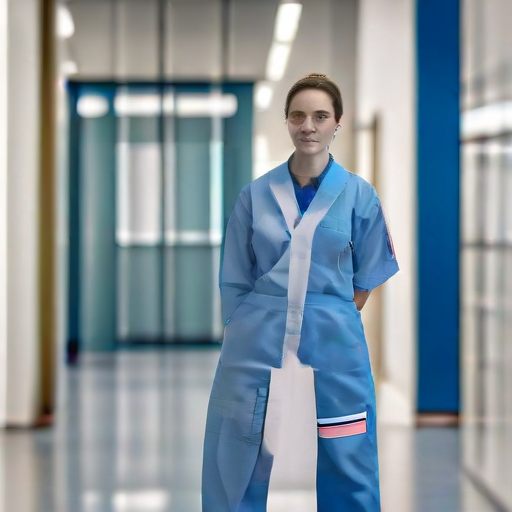

In [7]:
import torch
from diffusers import DiffusionPipeline, LCMScheduler
import time

# 1. Load the Base Model (Segmind-Vega)
# This is the distilled SDXL model (the "brain")
base_model_id = "segmind/Segmind-Vega"
pipe = DiffusionPipeline.from_pretrained(
    base_model_id, 
    torch_dtype=torch.float16, 
    use_safetensors=True,
    variant="fp16"
)

# 2. Load the VegaRT Adapter (The "Speed Boost")
# This is the LoRA that converts the model into an LCM (Turbo) model
adapter_id = "segmind/Segmind-VegaRT"
pipe.load_lora_weights(adapter_id)
pipe.fuse_lora() # Merge weights for maximum speed

# 3. Switch to LCM Scheduler
pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)
# pipe.set_progress_bar_config(disable=True)
pipe.to("cuda")

prompt = "realistic portrait photo of a female doctor wearing blue scrubs in a hospital corridor, professional lighting"

start_time = time.time()

# 4. Generate
image = pipe(
    prompt=prompt,
    width=512,
    height=512,
    num_inference_steps=4, # VegaRT is optimized for 2-8 steps
    guidance_scale=0.0     # LCM models often prefer 0-1 guidance
).images[0]

print(f"Time Taken (VegaRT): {time.time() - start_time}")
display(image)

## Image Generation and Validation Pipeline

This work employs a controlled image generation and validation pipeline built on top of **Stable Diffusion v1.5** with **Latent Consistency Model (LCM) acceleration**, combined with **post-generation filtering** based on semantic validity and perceptual quality. The overall goal is to construct a **person-centric synthetic image dataset** suitable for downstream fairness and bias analysis, while avoiding common failure modes of large-scale generative models.

### Base Image Generation

Images are generated using Stable Diffusion v1.5, augmented with the **LCM LoRA adapter** to reduce the number of inference steps required for high-quality generation:

- Base model: `runwayml/stable-diffusion-v1-5`
- Acceleration: `latent-consistency/lcm-lora-sdv1-5`
- Scheduler: `LCMScheduler`
- Inference steps: 4

LCM enables 'one-step-like' generation while preserving visual fidelity, as demonstrated by:
- Song et al., *Latent Consistency Models* (2023)
- Hugging Face Diffusers LCM documentation

Batching is used during generation to maximize GPU utilization, while avoiding multithreaded generation, as Stable Diffusion inference is **GPU-bound** and does not benefit from concurrent invocation on a single device.

---

### Semantic Validity Filtering (Person & Face Constraints)

To ensure that generated images depict **exactly one person with a clearly associated face**, a two-stage object detection process is applied:

1. **Person detection** using a YOLO-based detector -> yolov12: https://docs.ultralytics.com/models/yolo12/
2. **Face detection** using a specialized face-detection YOLO model -> yolov12-face: https://github.com/YapaLab/yolo-face & face_mesh

An image is considered *semantically valid* only if:
- At least one person is detected above a confidence threshold.
- Exactly one face is detected above a confidence threshold.
- The face bounding box lies within, or significantly overlaps with, the person bounding box.
- The face occupies a minimum fraction of the person’s area, ensuring the face is not incidental or background noise.

This logic is consistent with practices used in dataset curation pipelines that aim to avoid spurious correlations caused by background faces or partial detections (e.g., CCV2, FairFace, FACET).

Relevant references:
- Ultralytics YOLOv8 documentation  
- Buolamwini & Gebru, *Gender Shades* (2018)  
- Merler et al., *Diversity in Faces* (2019)

---

### Aesthetic Quality Filtering Using CLIP

In addition to semantic validity, perceptual quality is assessed using a **CLIP-based aesthetic predictor** released by LAION:

- Encoder: CLIP ViT-L/14 -> https://github.com/LAION-AI/aesthetic-predictor/blob/main/asthetics_predictor.ipynb
- Regressor: linear aesthetic head trained on human preference scores  
- Source: LAION-AI aesthetic-predictor repository  
  (https://github.com/LAION-AI/aesthetic-predictor)

The model outputs a **continuous aesthetic score**, which correlates with human judgments of visual appeal rather than objective correctness.

#### Choice of Aesthetic Threshold

While LAION provides curated subsets using thresholds such as **aesthetic ≥ 5**, these thresholds were explicitly intended to construct **highly aesthetic subsets**, not to define minimum acceptable quality. This distinction is emphasized in the LAION-Aesthetics documentation and dataset releases.

In this work, a **lower threshold of aesthetic ≥ 3.0** is used. This decision is motivated by several factors:

- Images with scores in the range **3–4 are often sharp, well-framed, and semantically correct**, particularly for portrait-style images.
- Higher thresholds disproportionately favor stylized lighting, shallow depth-of-field, and artistic composition, which may introduce bias unrelated to demographic or occupational attributes.
- Using a lower threshold avoids systematically discarding valid but visually “plain” images, which is critical for fairness-oriented analysis.

This interpretation aligns with observations reported by:
- Schuhmann et al., *LAION-Aesthetics: An Aesthetic Dataset* (2022)
- LAION-AI aesthetic predictor documentation

Accordingly, aesthetic filtering is treated as a **soft quality control mechanism**, layered on top of strict semantic validation, rather than a proxy for correctness.

---

### Negative Prompting

Negative prompts are applied uniformly across generations to suppress known diffusion artifacts such as:
- Blur and compression artifacts
- Cropped or partial faces
- Non-photorealistic renderings (e.g., CGI, illustration)
- Watermarks and embedded text

This approach follows common best practices in Stable Diffusion usage and does not encode demographic or stylistic constraints.

---

### Dataset Construction Strategy

Only images that pass **both semantic validation and aesthetic filtering** count toward the target dataset size. Invalid generations are optionally retained for analysis but do not contribute to the final dataset count.

Key properties of the pipeline:
- Dataset size is **defined by validated samples**, not generation attempts.
- Generation is **resumable**, allowing interrupted runs to continue without duplication.
- Metadata (image name, label, aesthetic score, bounding boxes) is logged incrementally to a CSV file for transparency and auditability.

This design ensures that dataset construction is:
- Deterministic with respect to size
- Robust to stochastic generation failures
- Explicitly aligned with fairness-oriented evaluation goals

---

### Summary

Overall, this pipeline reflects a synthesis of practices from large-scale generative dataset construction (e.g., LAION) and fairness-focused dataset curation. By decoupling semantic validity from aesthetic preference and carefully controlling acceptance criteria, the resulting dataset is better suited for analyzing spurious correlations and representation biases in generative models.







## Prompt Justification

**Final Prompt Used:**  
"full-body realistic photo of a {label}, standing, centered, in a professional setting appropriate for their occupation, sharp focus, 35mm lens, natural professional lighting"

Each phrase is intentionally chosen for functional and fairness-related reasons.  
Below is the justification for every component, supported by verified academic literature.

---

### **1. "full-body realistic photo of a {label}"**

#### Why this is needed
Stable Diffusion v1.5 exhibits a strong prior toward **close-up or upper-body portraits**, especially for professions, due to dataset biases in LAION-scale web data.

#### Supporting papers
- **Rombach et al., “High-Resolution Image Synthesis with Latent Diffusion Models” (CVPR 2022)** - https://arxiv.org/abs/2112.10752

  Shows that diffusion models inherit dataset framing biases and require explicit spatial constraints to override portrait defaults.
- **Chen et al., “T2I-CompBench” (ICCV 2023)** - https://arxiv.org/abs/2307.06350

  Demonstrates that under-specified prompts frequently yield incomplete or cropped subjects; explicit body-level constraints significantly improve compositional correctness.

#### Why the pipeline needs this
Your validation pipeline enforces **one full person and one clearly attached face**.  
Close-up portraits often fail person–face spatial validation, reducing yield.

---

### **2. "standing"**

#### Why this is needed
Pose and spatial placement are known weaknesses of text-to-image diffusion models.

#### Supporting papers
- **Nichol et al., “GLIDE: Towards Photorealistic Image Generation” (ICML 2022)** - https://arxiv.org/abs/2112.10741

  Shows that explicit pose and framing tokens (e.g., standing) improve global structure and reduce spatial ambiguity.
- **Chen et al., “T2I-CompBench” (ICCV 2023)** - https://arxiv.org/abs/2307.06350

  Reports that positional constraints significantly reduce multi-subject confusion and framing errors.

#### Why the pipeline needs this
YOLO-based validation frequently fails when:
- faces are near image borders,
- subjects are partially outside the frame,
- multiple people appear unintentionally.

Explicit pose and centering mitigate these failure modes.

---

### **3. "in a professional setting appropriate for their occupation"**

#### Why this is needed
This phrase provides **semantic grounding** without explicitly naming locations (e.g., hospital, classroom), which are known to amplify demographic and cultural biases.

#### Supporting papers
- **Friedrich et al., “Fair Diffusion” (NeurIPS 2023)** - https://arxiv.org/abs/2302.10893

  Recommends abstract, role-appropriate context to reduce stereotype amplification while preserving semantic coherence.
- **Luccioni et al., “Stable Bias” (NeurIPS 2023, Datasets & Benchmarks)** - https://arxiv.org/abs/2303.11408

  Shows that explicit environment tokens often correlate with skewed demographic representations in diffusion outputs.

#### Why the pipeline needs this
This balances:
- contextual realism,
- fairness constraints,
- avoidance of overfitting to LAION scene stereotypes.

---

### **4. "sharp focus"**

#### Why this is needed
Latent Consistency Models (LCM) operate with extremely low diffusion steps, which increases the risk of blur unless counteracted at the prompt level.

#### Supporting papers
- **Luo et al., “Latent Consistency Models” (2023)** - https://arxiv.org/abs/2310.04378

  Notes that low-step sampling degrades sharpness unless reinforced by high-frequency detail cues.
- **Rombach et al., “High-Resolution Image Synthesis with Latent Diffusion Models” (CVPR 2022)** - https://arxiv.org/abs/2112.10752

  Identifies prompt-level detail descriptors as influential in texture and edge clarity.

#### Why the pipeline needs this
Blur directly lowers:
- CLIP aesthetic scores,
- YOLO face/person confidence,
- overall valid image yield.

---

### **5. "35mm lens"**

#### Why this is needed
Camera tokens act as **implicit geometric priors**, influencing subject distance, perspective, and body proportions.

#### Supporting papers
- **Fang et al., “Camera Settings as Tokens” (SIGGRAPH Asia 2024)** - https://dl.acm.org/doi/10.1145/3680528.3687635

  Empirically demonstrates that focal length tokens systematically control framing and spatial distortion in diffusion models.
- **Chen et al., “T2I-CompBench” (ICCV 2023)** - https://arxiv.org/abs/2307.06350

  Shows that camera-related metadata tokens improve spatial consistency and reduce compositional errors.

#### Why the pipeline needs this
A 35mm lens prior increases the probability of:
- full-body framing,
- natural proportions,
- compatibility with face–person spatial validators.

---

### **6. "natural professional lighting"**

#### Why this is needed
Lighting is one of the strongest contributors to perceived image quality and aesthetic scoring.

#### Supporting papers / resources
- **Schuhmann et al., LAION Improved Aesthetic Predictor (2022, GitHub)** - https://github.com/christophschuhmann/improved-aesthetic-predictor

  Demonstrates that lighting strongly influences CLIP-based aesthetic regression scores.
- **Friedrich et al., Fair Diffusion (NeurIPS 2023)** - https://arxiv.org/abs/2302.10893

  Notes that consistent, neutral lighting reduces noise artifacts and downstream bias.

#### Why the pipeline needs this
Improved lighting increases:
- CLIP aesthetic scores,
- edge definition,
- detector reliability under low-step sampling.

---

### **Summary Table**

| Prompt element | Supporting sources | Purpose |
|---------------|-------------------|--------|
| **full-body** | Rombach et al. 2022; T2I-CompBench 2023 | Avoid close-ups; ensure full-body visibility |
| **standing, centered** | GLIDE 2022; T2I-CompBench 2023 | Stabilize framing; improve detector success |
| **professional setting appropriate for their occupation** | Fair Diffusion 2023; Stable Bias 2023 | Context without explicit location bias |
| **sharp focus** | LCM 2023; SD 2022 | Counteract low-step blur |
| **35mm lens** | Camera Settings as Tokens 2024; T2I-CompBench 2023 | Control perspective and body framing |
| **natural professional lighting** | LAION Aesthetic Predictor; Fair Diffusion 2023 | Improve aesthetic score and detection reliability |


## Conclusion

The best performing model in terms of speed & quality appears to be the SDv1.5 + LoRa hence the pipeline in ImageGeneration.py